In [1]:
import os
import re
from IPython.display import clear_output
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
# from oneibl.onelight import ONE # only used for downloading data
# import wget
from utils import *
from plotting_utils import *
from analysis_utils import *
import dglm_hmm1
from pandas.errors import SettingWithCopyWarning
warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)


ibl_data_path = '../data_IBL'
dfAll = pd.read_csv(ibl_data_path + '/Ibl_processed.csv')
colorsFeatures = [['#FAA61A','indigo','#99CC66','#59C3C3','#9593D9'],['#FAA61A',"#2369BD","#A9373B",'#99CC66','#59C3C3','#9593D9']]
#colorsStates = ['orange','firebrick','forestgreen']#['orange','slateblue','forestgreen'] #['#FAA61A','#59C3C3','#9593D9','#99CC66','indigo'] #['darkorange','darkblue','forestgreen','purple']
colorsStates = ['tab:orange','tab:blue', 'tab:green','tab:red']
myFeatures = [['bias','delta stimulus', 'previous choice', 'previous answer'],['bias','contrast left','contrast right', 'previous choice', 'previous answer']]
sns.set_context("talk")
# colormap = ['rebeccapurple','teal','darkturquoise','springgreen','gold']
# colormap = ['rebeccapurple','royalblue','limegreen','orange']
colormap = ['tab:purple','tab:pink','tab:cyan','yellowgreen']

In [2]:
labChosen =  ['angelakilab','churchlandlab','wittenlab']
subjectsAll = []
for lab in labChosen:
    subjects = np.unique(dfAll[dfAll['lab'] == lab]['subject']).tolist()
    subjectsAll = subjectsAll + subjects

if ('NYU-01' in subjectsAll):
    subjectsAll.remove('NYU-01')
if ('NYU-06' in subjectsAll):
    subjectsAll.remove('NYU-06')
if ('CSHL_007' in subjectsAll):
    subjectsAll.remove('CSHL_007')
if ('CSHL049' in subjectsAll):
    subjectsAll.remove('CSHL049')


avg_session_length = 988 # from ibl_witten_15



In [3]:
# setting hyperparameters
sigmaList = [0] + [10**x for x in list(np.arange(-3,1,0.5,dtype=float))] + [10**x for x in list(np.arange(1,4,1,dtype=float))]
alphaList = [2*(10**x) for x in list(np.arange(-1,6,0.5,dtype=float))] 
L2penaltyW = 1
maxiter = 200
bestSigma = 1 # verified from fitting multiple sigmas
bestSigmaInd = 7
bestAlpha = 2
priorDirP = [100,10] # to read dGLMHMM1 model
fit_init_states = False
K = 3
D = 4 # number of features
sessStop = -1 # last session to use in fitting
splitFolds = 5
inits = 21

In [10]:
# NEW SAVING OF FILES AND MORE ANIMALS:
testLlAll = np.zeros((4, len(subjectsAll), len(sigmaList)))
bestTestLl = np.zeros((4, len(subjectsAll)))

for idx in range(0, len(subjectsAll)):
    print(idx)
    subject = subjectsAll[idx]
    testLl = []
    testAccuracy = []
    avgTestLl = []
    avgTestAccuracy = []

    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D) # NOT LOOKING AT FULL DATASET
    N = x.shape[0]
    presentTrain, presentTest = split_data(N, sessInd, folds=splitFolds, blocks=10, random_state=1)
    sess = len(sessInd) - 1

    for K in [1,2,3,4]:

        data = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}-state_multiple-sigmas_priorDirP={priorDirP}_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
        p = data['allP']
        w = data['allW']
        trainLl = data['trainLl']

        dGLM_HMM1 = dglm_hmm1.dGLM_HMM1(N,K,D,2)
        pi = np.ones((K))
        llTest = np.zeros((splitFolds, len(sigmaList)))
        testLl_sessions = np.zeros((splitFolds, len(sigmaList), sess))
        for fold in range(splitFolds):
            for ind_sigma in range(len(sigmaList)):
                testLl_sessions[fold, ind_sigma], llTest[fold, ind_sigma], _ = dGLM_HMM1.evaluate(x, y, sessInd, presentTest[fold], p[fold, ind_sigma], pi, w[fold, ind_sigma])

        np.savez(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}-state_multiple-sigmas_priorDirP={priorDirP}_L2penaltyW={L2penaltyW}_untilSession{sessStop}', trainLl=trainLl, allP=p, allW=w, testLl=llTest, testLl_sessions=testLl_sessions)

        avgTestLl.append(np.mean(llTest,axis=0))
    avgTestLl = [x - avgTestLl[0][0] for x in avgTestLl] # normalizing to GLM-HMM sigma=0 K=1

    for K in [1,2,3,4]:
        testLlAll[K-1][idx] = avgTestLl[K-1]

    bestSigmaInd = 7 # Choosing best sigma index across animals
    for K in [1,2,3,4]:
        bestTestLl[K-1][idx] = avgTestLl[K-1][bestSigmaInd] - avgTestLl[0][bestSigmaInd] # delta
    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31


Text(0.5, 0.98, 'Average model performance as a function of # states and <sigma>')

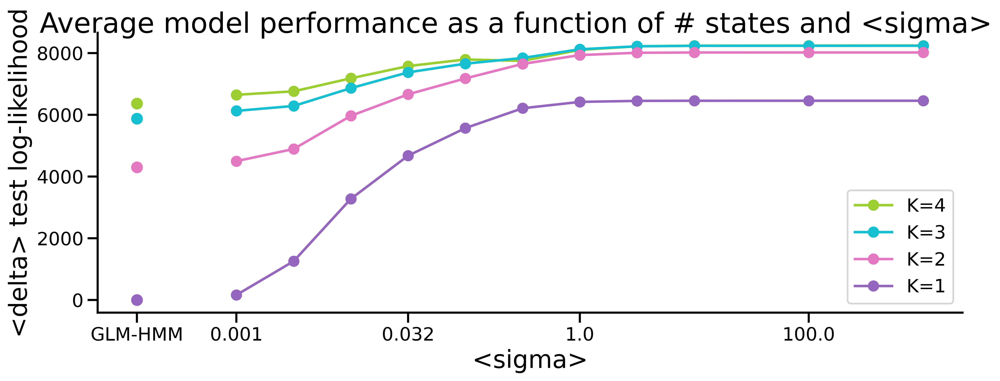

In [5]:
# Plotting one plot with all animals and their mean
fig, axes = plt.subplots(1, figsize = (12,4.5), dpi=400)
# fig, axes = plt.subplots(1, figsize = (12,5.5), dpi=400)
fig.tight_layout()
# axes.set_title('averaged across all animals')
for K in range(4,0,-1):
    # for idx in range(0, len(subjectsAll)):
    #     subject = subjectsAll[idx]
    #     plot_testLl_CV_sigma(testLlAll[K-1][idx], sigmaList=sigmaList, label=None, color=colormap[K-1], axes=axes, alpha=0.06)

    plot_testLl_CV_sigma(np.mean(testLlAll[K-1], axis=0), sigmaList=sigmaList, label=f'K={K}', color=colormap[K-1], axes=axes, alpha=1)
axes.set_ylabel("<delta> test log-likelihood", size=22)
axes.set_xlabel('<sigma>', size=22)
# axes.set_ylim(-0.01,0.18)
axes.spines[['right', 'top']].set_visible(False)
fig.suptitle('Average model performance as a function of # states and <sigma>', size=25)
# plt.savefig(f'../figures/TestLl_vs_states_sigma_all-animals.png', bbox_inches='tight', dpi=400)

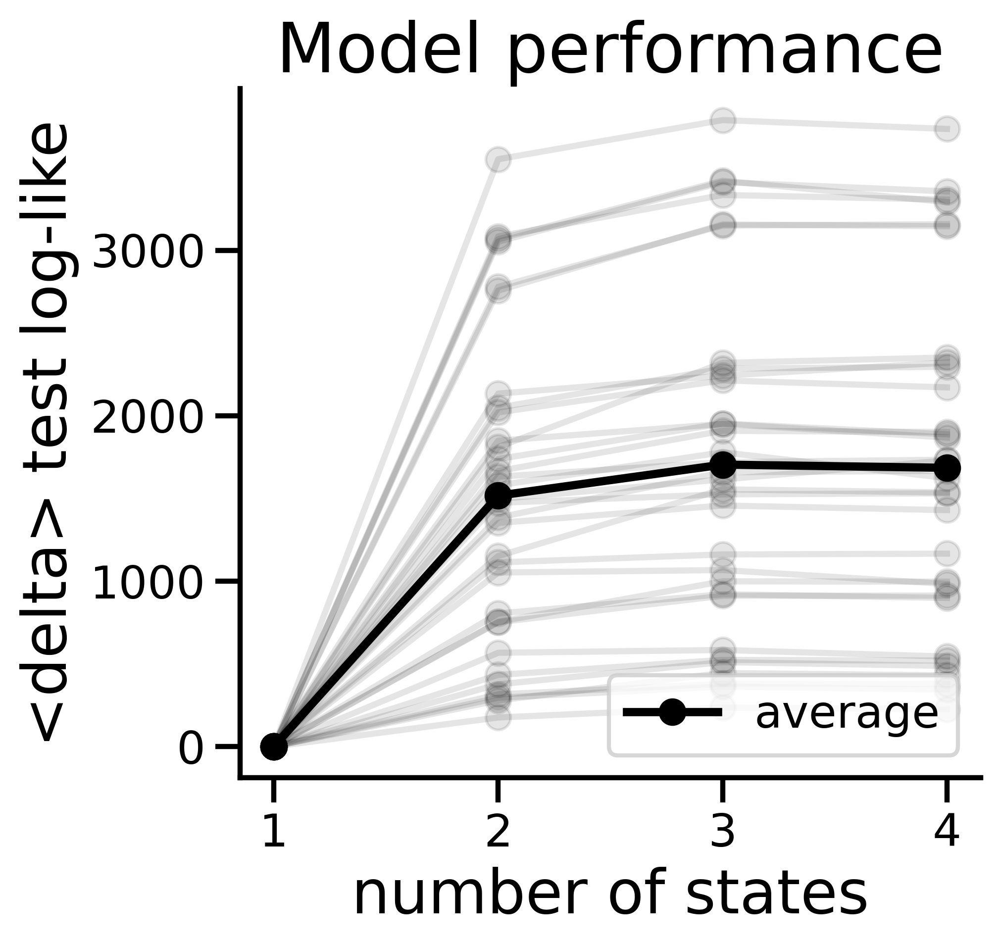

In [6]:
fig, axes = plt.subplots(1,figsize=(5,4.5), dpi=400)
# fig, axes = plt.subplots(1,figsize=(6,5.5), dpi=400)
fig.tight_layout()
for idx in range(0, len(subjectsAll)):
    axes.plot([1,2,3,4],bestTestLl[:,idx],'-o', color='black',alpha=0.1)
    axes.set_xticks([1,2,3,4])
# plotting mean across all animals
axes.plot([1,2,3,4], np.mean(bestTestLl, axis=1), '-o', color='black',alpha=1, label='average', linewidth=3)
# axes.errorbar([1,2,3,4], np.mean(bestTestLl, axis=1), yerr= np.std(bestTestLl, axis=1), color='black')
axes.set_title(f'sigma={np.round(sigmaList[bestSigmaInd],2)}')
axes.set_xlabel('number of states', size=22)
axes.set_ylabel('<delta> test log-like', size=22)
axes.spines[['right', 'top']].set_visible(False)
axes.set_title('Model performance', size=25)
axes.legend(loc='lower right')
# axes.set_ylim(-0.001,0.055)
plt.savefig(f'../figures/TestLl_vs_states_sigma=1_all-animals.png', bbox_inches='tight', dpi=400)

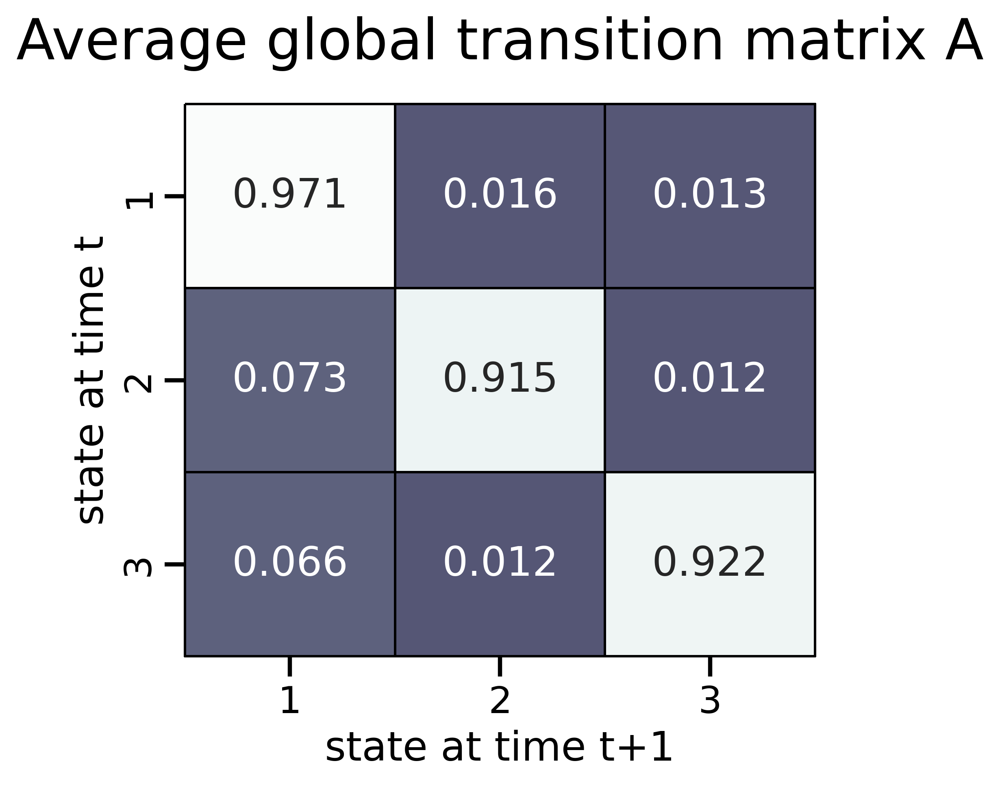

In [20]:
# Reading parameters and plotting them at best sigma for 
bestSigmaInd = 7 # equivalent to sigma=1
K = 3

allP = np.zeros((len(subjectsAll), K, K))   

for idx in range(0, len(subjectsAll)):
    subject=subjectsAll[idx]
    _, _, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    data = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}-state_multiple-sigmas_priorDirP={priorDirP}_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
    allP[idx] = np.mean(data['allP'], axis=0)[bestSigmaInd]

plt.figure(figsize=(5, 4.5), dpi=400)
K = np.mean(allP, axis=0).shape[0] # 
s = sns.heatmap(np.round(np.mean(allP, axis=0),3),annot=True, vmin=-0.6, vmax=1,cmap='bone', fmt='g', linewidths=1, linecolor='black',clip_on=False, cbar=False)
s.set(xlabel='state at time t+1', ylabel='state at time t', title=f'', xticklabels=range(1,K+1), yticklabels=range(1,K+1))
plt.title('Average global transition matrix A', size=25, pad=20)
plt.savefig(f'../figures/AverageP_2-state_sigma=1_allAnimals.png', bbox_inches='tight', dpi=400)
      

In [21]:
allW0 = np.empty((len(subjectsAll)), dtype=object)
for idx in range(0, len(subjectsAll)):
    subject=subjectsAll[idx]
    _, _, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    data = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}-state_multiple-sigmas_priorDirP={priorDirP}_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
    allW0[idx] = np.mean(data['allW'], axis=0)[0] # standard GLM-HMM

In [22]:
# INIT 0 means initialized from global fit
K = 3
allW = np.empty((len(subjectsAll)), dtype=object)
allP = np.empty((len(subjectsAll)), dtype=object)

for idx in range(0,len(subjectsAll)):
    subject=subjectsAll[idx]
    _, _, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    param = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}_state_alpha={bestAlpha}_multiple-initsP_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
    allP[idx] =  param['allP'][0] # starting from best dGLMHMM1 fit
    allW[idx] =  param['allW'][0] # starting from best dGLMHMM1 fit
    

In [23]:
allPhi = np.empty((len(subjectsAll)), dtype=object) # observation probabilities
for idx in range(0,len(subjectsAll)):
    subject=subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    N = sessInd[-1]
    dGLMHMM2 = dglm_hmm2.dGLM_HMM2(N,K,D,2)
    allPhi[idx] = dGLMHMM2.observation_probability(x, allW[idx])

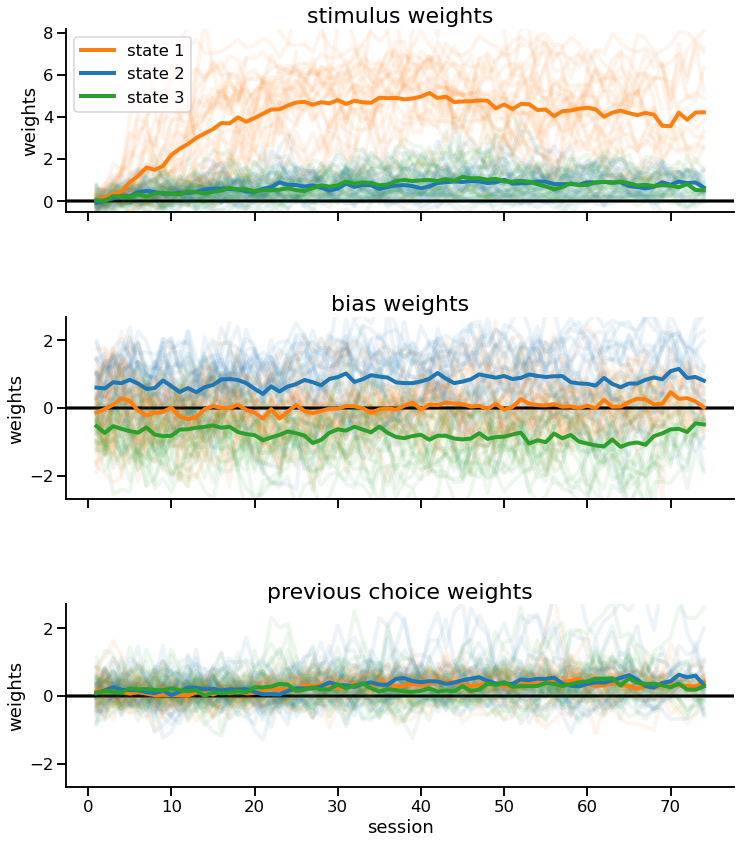

In [24]:
# Plotting weights and transition matrix averaged across all animals - first 70 sessions
maxSess = 75
Kplot = [3]
bestSigmaInd = 7
reorderFeatures = [1,0,2,3] 
myFeatures = ['stimulus','bias','previous choice','previous correct side']
for K in Kplot:
    arrW = np.ma.empty((maxSess, K, D, 2, len(subjectsAll)))
    arrW.mask = True

    #fig, axes = plt.subplots(D, 1,figsize=(12.5,15), sharex=True)#, dpi=400)
    fig, axes = plt.subplots(D-1, 1,figsize=(12.5,13.5), sharex=True)
    fig.tight_layout(pad=5)
    yLim=[[-0.5,8.2],[-2.7,2.7],[-2.7,2.7],[-2.7,2.7]]

    avgP = []
    avgW = []
    for idx in range(0,len(subjectsAll)):
        subject = subjectsAll[idx] 
        _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

        avgW.append(allW[idx][sessInd[:-1]]) 
        avgP.append(allP[idx][sessInd[:-1]])
        stop = min(avgW[idx].shape[0], maxSess)
        arrW[:stop, :K, :D, :2, idx] = avgW[idx][:stop]
        plotting_weights_per_feature(-(avgW[idx][:stop,:,reorderFeatures[:-1]]), [x for x in range (0, stop)], axes, yLim=yLim, colors=colorsStates, labels=['stimulus','bias','previous choice','previous correct answer'], linewidth=4, linestyle='-', alpha=0.08, legend=False, sortedStateInd=None)
    # plotting_weights_per_feature(-(allW0[0][:,:,reorderFeatures]), [x for x in range (0, maxSess)], axes, yLim=yLim, colors=colorsStates, labels=['stimulus','bias','previous choice','previous correct answer'], linewidth=3, linestyle='--', alpha=1, legend=False, sortedStateInd=None)
    plotting_weights_per_feature(-(arrW.mean(axis=4)[:,:,reorderFeatures[:-1]]), [x for x in range (0, maxSess)], axes, yLim=yLim, colors=colorsStates, labels=['stimulus','bias','previous choice','previous correct answer'], linewidth=4, linestyle='-', alpha=1, legend=True, sortedStateInd=None)
    

for d in range(0,D-1):
    if (d!=0):
        axes[d].get_legend().remove()
        axes[0].legend(loc = 'upper left')
    axes[d].set_ylim(yLim[d])
    axes[d].set_ylabel(f'weights')
    axes[d].set_title(f'{myFeatures[d]} weights', size=22)
    axes[d].spines[['right', 'top']].set_visible(False)

plt.savefig(f'../figures/weights_sigma=1_allAnimals.png', bbox_inches='tight', dpi=400)

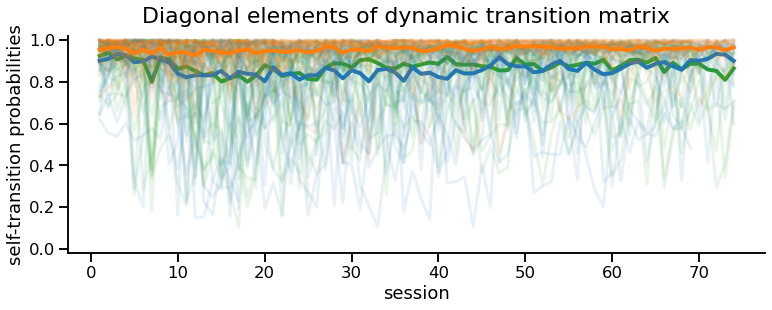

In [25]:
# Plotting weights and transition matrix averaged across all animals - first 70 sessions
maxSess = 75
Kplot = [3]
bestSigmaInd = 7
reorderFeatures = [1,0,2,3] 
#fig, axes = plt.subplots(1, figsize = (12.5,5))
fig, axes = plt.subplots(1, figsize = (12.5,4))
for K in Kplot:
    arrP = np.ma.empty((maxSess, K, K, len(subjectsAll)))
    arrP.mask = True

    avgP = []
    for idx in range(0,len(subjectsAll)):
        subject = subjectsAll[idx] 
        _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

        avgP.append(allP[idx][sessInd[:-1]])
        stop = min(avgW[idx].shape[0], maxSess)
        arrP[:stop, :K, :K, idx] = avgP[idx][:stop]
        sessInd = range(0,stop)
        sess = len(sessInd)-1
        for i in range(0,avgP[idx][:stop].shape[1]):
            axes.plot(range(1,sess+1), avgP[idx][:stop][sessInd[:-1],i,i], linestyle='-', linewidth=3, color=colorsStates[i], label=f'state {i+1}', zorder=avgP[idx][:stop].shape[1]-i, alpha=0.1)
        
        # plotting_self_transition_probabilities(avgP[idx][:stop], range(0,stop), axes, title='', linestyle='-', linewidth=2, save_fig=False, sortedStateInd=None, colorsStates=colorsStates)
    
    plotting_self_transition_probabilities(arrP.mean(axis=3), range(0,maxSess), axes, title='', linestyle='-', linewidth=4, save_fig=False, sortedStateInd=None, colorsStates=colorsStates)
    # # plotting transition matrix averaged across folds
    # fig, axes = plt.subplots()
    # plot_transition_matrix(np.mean(avgP, axis=0), title='Averaged', sortedStateInd=None) # not sorted

axes.set_ylabel("self-transition probabilities")
axes.set_xlabel('session')
axes.spines[['right', 'top']].set_visible(False)
fig.suptitle('Diagonal elements of dynamic transition matrix', size=22)
axes.set_ylim(-0.02,1.02)
plt.savefig(f'../figures/Self-transition_probabilties-alpha={bestAlpha}_allAnimals.png', bbox_inches='tight', dpi=400)
          

In [26]:
# Computing posterior latents across animals
allGamma = np.empty((len(subjectsAll)), dtype=object)
K = 3
truepi = np.ones((K))
for idx in range(0,len(subjectsAll)):
    subject=subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    N = sessInd[-1]
    presentAll = np.ones((N))
    dGLM_HMM = dglm_hmm2.dGLM_HMM2(N,K,D,2)
    allGamma[idx] = dGLM_HMM.get_posterior_latent(allP[idx], truepi, allW[idx], x, y, presentAll, sessInd, sortedStateInd=None)


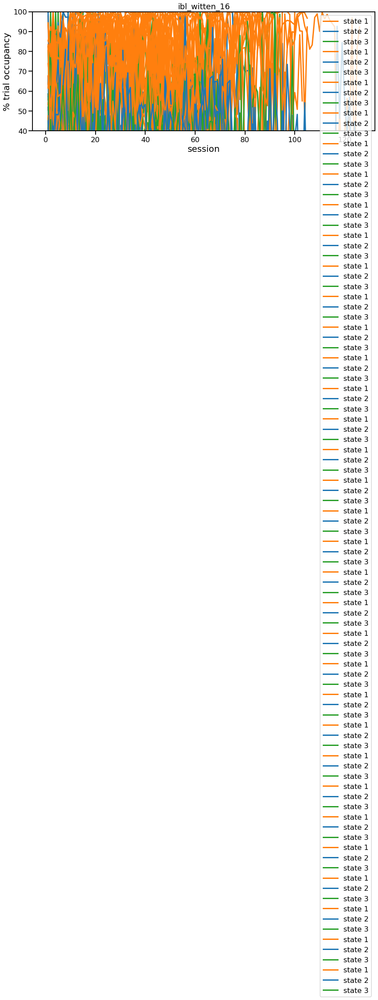

In [27]:
K = 3
allStateCount = np.empty((len(subjectsAll)), dtype=object)
allStateCorrect = np.empty((len(subjectsAll)), dtype=object)
allOverallCorrect = np.empty((len(subjectsAll)), dtype=object)
allOverallMixtureCorrect = np.empty((len(subjectsAll)), dtype=object)
allStateCorrectSeparate = np.empty((len(subjectsAll), 2), dtype=object) # separate for easy trials and hard trials
allOverallCorrectSeparate = np.empty((len(subjectsAll), 2), dtype=object) # separate for easy trials and hard trials
blocksStateRight = np.empty((len(subjectsAll)), dtype=object)
blocksStateLeft = np.empty((len(subjectsAll)), dtype=object)

allEmpiricalCorrect = np.empty((len(subjectsAll)), dtype=object)
allEmpiricalCorrectSeparate = np.empty((len(subjectsAll), 2), dtype=object)

fig, axes = plt.subplots(1, figsize = (14,5))#, dpi=400)
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    biasedBlockTrials, biasedBlockStartInd, biasedBlockSession, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)
    # Plotting task occupancy of each state across sessions
    # fig, axes = plt.subplots(1, figsize = (14,5))#, dpi=400)
    axes.set_title(subject)
    allStateCount[idx] = plot_state_occupancy_sessions(allGamma[idx], sessInd, axes, colors=colorsStates)
    axes.set_ylim(-1,101)

    # plotting task accuracy in each state across sessions
    # fig, axes = plt.subplots(1, figsize = (14,5))#, dpi=400)
    axes.set_title(subject)
    _, _, allOverallCorrect[idx], allStateCorrect[idx] = accuracy_states_sessions(allGamma[idx], allPhi[idx], y, correctSide, sessInd)
    axes.set_ylim(40,100)

    # allOverallMixtureCorrect[idx] = accuracy_mixture_states_sessions(allGamma[idx], allPhi[idx], y, correctSide, sessInd)

    # calculating performance on easy trials for each state
    data = dfAll[dfAll['subject']==subject]
    dateToKeep = np.unique(data['date'])[0:sessStop]    
    dataTemp = pd.DataFrame(data.loc[data['date'].isin(list(dateToKeep))])
    contrastLeft=np.array(dataTemp['contrastLeft'])
    contrastRight=np.array(dataTemp['contrastRight'])
    easyTrials = (contrastLeft > 0.45).astype(int) | (contrastRight > 0.45).astype(int)
    correctSidee = np.array(dataTemp['correctSide'])

    # computing per state accuracy for easy trials
    N = y.shape[0]
    p_correct_states = np.ma.empty((N, K, 2)) # separate for easy and hard trials (last column) # 1 = easy, 0 = hard
    p_correct = np.ma.empty((N, 2))
    p_correct_states_sessions = np.ma.empty((len(sessInd)-1, K, 2))
    p_correct_sessions = np.ma.empty((len(sessInd)-1, 2))

    p_correct_states.mask = True
    p_correct.mask = True
    p_correct_states_sessions.mask = True
    p_correct_sessions.mask = True

    for session in range(0, len(sessInd)-1):
        for t in range(sessInd[session],sessInd[session+1]):
            for k in range(0,K):
                p_correct_states[t, k, easyTrials[t]] = allPhi[idx][t, k, correctSide[t]]
            if (np.ma.is_masked(p_correct_states[t, 0, 0]) == False): # means trial happened (not masked)
                p_correct[t, 0] = p_correct_states[t, :, 0] @ allGamma[idx][t] # hard trials
            if (np.ma.is_masked(p_correct_states[t, 0, 1]) == False): # means trial happened (not masked)
                p_correct[t, 1] = p_correct_states[t, :, 1] @ allGamma[idx][t] # easy trials
    
        p_correct_states_sessions[session] = np.nanmean(p_correct_states[sessInd[session]:sessInd[session+1]], axis=0) 
        p_correct_sessions[session] = np.nanmean(p_correct[sessInd[session]:sessInd[session+1]], axis=0)

    allStateCorrectSeparate[idx, 0] = 100 * p_correct_states_sessions[:, :, 0] # hard
    allStateCorrectSeparate[idx, 1] = 100 * p_correct_states_sessions[:, :, 1] # easy
    allOverallCorrectSeparate[idx, 0] = 100 * p_correct_sessions[:, 0]
    allOverallCorrectSeparate[idx, 1] = 100 * p_correct_sessions[:, 1]

    # empirical accuracy
    empiricalAccuracy = np.zeros((len(sessInd)-1))
    correct = correctSide == y
    for s in range(0,len(sessInd)-1):
        empiricalAccuracy[s] = np.mean(correct[sessInd[s]:sessInd[s+1]]) * 100
    allEmpiricalCorrect[idx] = empiricalAccuracy

    empiricalCorrectSeparate = np.ma.empty((N, 2))
    empiricalCorrectSeparate.mask = True
    empiricalCorrectSeparateSession = np.ma.empty((len(sessInd)-1, 2))
    empiricalCorrectSeparateSession.mask = True
    for session in range(0, len(sessInd)-1):
        for t in range(sessInd[session],sessInd[session+1]):
            empiricalCorrectSeparate[t, easyTrials[t]] = correct[t]
        empiricalCorrectSeparateSession[session] = np.nanmean(empiricalCorrectSeparate[sessInd[session]:sessInd[session+1]], axis=0)
    allEmpiricalCorrectSeparate[idx, 0] = 100 * empiricalCorrectSeparateSession[:, 0]
    allEmpiricalCorrectSeparate[idx, 1] = 100 * empiricalCorrectSeparateSession[:, 1]

    # Plotting alignment of biased states with biased blocks
    # fig, axes = plt.subplots(1, figsize=(14,5))
    # blocksStateRight[idx], blocksStateLeft[idx] = plot_aligned_fraction_blocks_state(allGamma[idx], sessInd, biasedBlockTrials, biasedBlockSession, axes)
    # axes.axvline(firstBlockSession+1, color='gray', zorder=0)

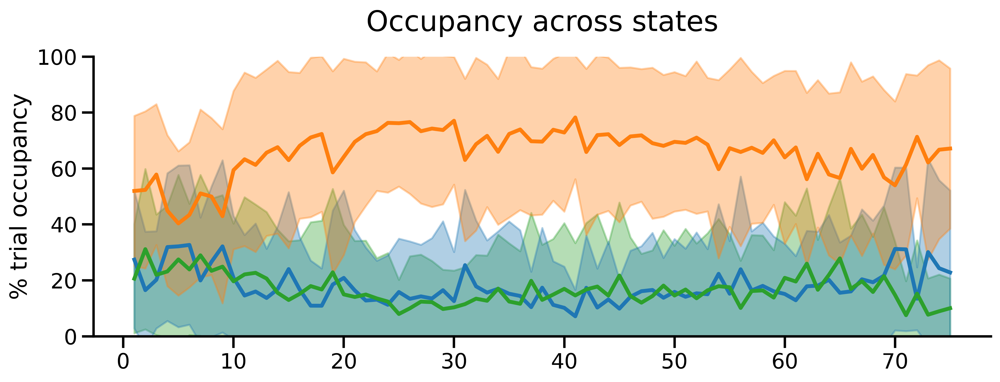

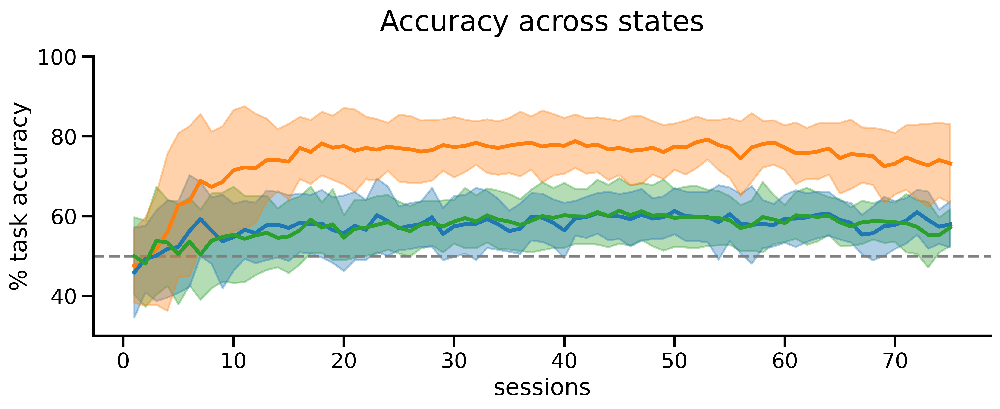

In [28]:
fig, axes = plt.subplots(1, figsize = (12.5,4), sharex=True, dpi=400) 
maxSess = 75
bestSigmaInd = 7
K = 3

arrStateCount = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateCount.mask = True

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    stop = min(len(sessInd)-1, maxSess)
    arrStateCount[:stop, :K, idx] = allStateCount[idx][:stop]
    # for k in range(0,K): # not plotting per-animal lines
    #     axes[0].plot(range(1,maxSess+1), arrStateCount[:,k,idx], color=colorsStates[k], linewidth=3, label=f'state {k+1}', alpha=0.08)
   
for k in range(0,K):
    axes.plot(range(1,maxSess+1), np.nanmean(arrStateCount[:,k,:], axis=1), color=colorsStates[k], linewidth=3, label=f'state {k+1}', zorder=3)
    axes.fill_between(range(1,maxSess+1), np.nanmean(arrStateCount[:,k,:], axis=1)-np.nanstd(arrStateCount[:,k,:], axis=1), np.nanmean(arrStateCount[:,k,:], axis=1)+np.nanstd(arrStateCount[:,k,:], axis=1), alpha=0.35, zorder=2-k, color=colorsStates[k])

axes.set_ylabel('% trial occupancy')
axes.set_xlabel('')
axes.set_ylim(0,100)
axes.legend(loc='upper left')
axes.spines[['right', 'top']].set_visible(False)
axes.get_legend().remove()
axes.set_title('Occupancy across states', size=22, pad=20)

fig, axes = plt.subplots(1, figsize = (12.5,4), sharex=True, dpi=400) 

arrStateCorrect = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateCorrect.mask = True

arrOverallCorrect = np.ma.empty((maxSess,len(subjectsAll)))
arrOverallCorrect.mask = True


axes.axhline(50,color='gray',linestyle='dashed')
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    stop = min(len(sessInd)-1, maxSess)
    arrStateCorrect[:stop, :K, idx] = allStateCorrect[idx][:stop]
    arrOverallCorrect[:stop, idx] = allOverallCorrect[idx][:stop]
    
    # for k in range(0,K): # not plotting per-animal lines
    #     axes[1].plot(range(1,maxSess+1), arrStateCorrect[:,k,idx], color=colorsStates[k], linewidth=3, label=f'state {k+1}', alpha=0.08)

# axes[1].plot(range(1,maxSess+1), np.nanmean(arrOverallCorrect[:,:], axis=1), color='black', linewidth=3, label=f'state {k+1}', zorder=3)
for k in range(0,K):
    axes.plot(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,k,:], axis=1), color=colorsStates[k], linewidth=3, label=f'state {k+1}', zorder=3)
    axes.fill_between(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,k,:], axis=1)-np.nanstd(arrStateCorrect[:,k,:], axis=1), np.nanmean(arrStateCorrect[:,k,:], axis=1)+np.nanstd(arrStateCorrect[:,k,:], axis=1), alpha=0.35, zorder=2-k, color=colorsStates[k])
axes.set_ylabel('% task accuracy')
axes.set_xlabel('sessions')
axes.set_ylim(30,100)
axes.legend(loc='upper left')
axes.spines[['right', 'top']].set_visible(False)
axes.get_legend().remove()
axes.set_title('Accuracy across states', size=22, pad=20)
plt.savefig(f'../figures/Occupancy_accuracy_states_allAnimals', bbox_inches='tight', dpi=400)


Text(0.5, 1.0, 'Per-state occupancy during early sessions')

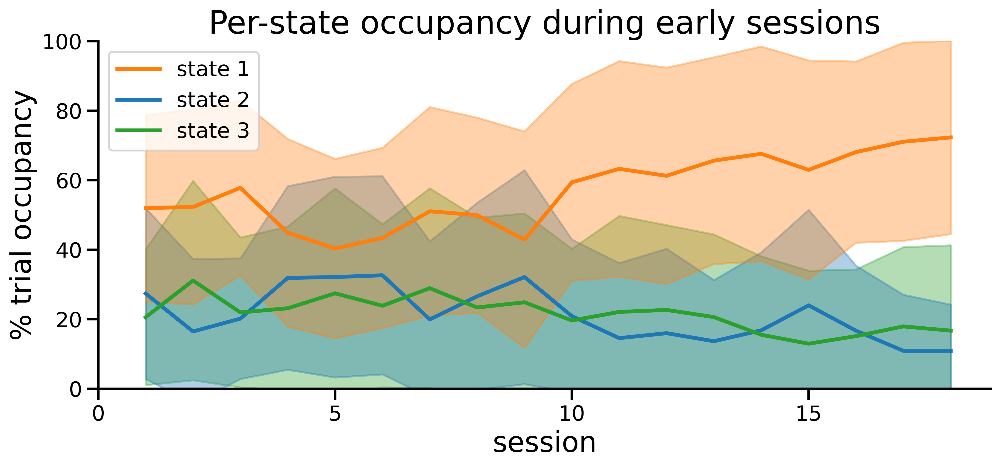

In [29]:
fig, axes = plt.subplots(1, figsize = (12.5,5), sharex=True, dpi=400) 
maxSess = 18
bestSigmaInd = 7
K = 3

arrStateCount = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateCount.mask = True

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    stop = min(len(sessInd)-1, maxSess)
    arrStateCount[:stop, :K, idx] = allStateCount[idx][:stop]
    # for k in range(0,K): # not plotting per-animal lines
    #     axes[0].plot(range(1,maxSess+1), arrStateCount[:,k,idx], color=colorsStates[k], linewidth=3, label=f'state {k+1}', alpha=0.08)
   
for k in range(0,K):
    axes.plot(range(1,maxSess+1), np.nanmean(arrStateCount[:,k,:], axis=1), color=colorsStates[k], linewidth=3, label=f'state {k+1}', zorder=3)
    axes.fill_between(range(1,maxSess+1), np.nanmean(arrStateCount[:,k,:], axis=1)-np.nanstd(arrStateCount[:,k,:], axis=1), np.nanmean(arrStateCount[:,k,:], axis=1)+np.nanstd(arrStateCount[:,k,:], axis=1), alpha=0.35, zorder=2-k, color=colorsStates[k])

axes.set_ylabel('% trial occupancy', size=22)
axes.set_ylim(0,100)
axes.legend(loc='upper left')
axes.set_xlabel('session', size=22)
axes.spines[['right', 'top']].set_visible(False)
axes.set_xticks(range(0,18,5),range(0,18,5))
axes.set_title('Per-state occupancy during early sessions', size=25)


# Figure 6

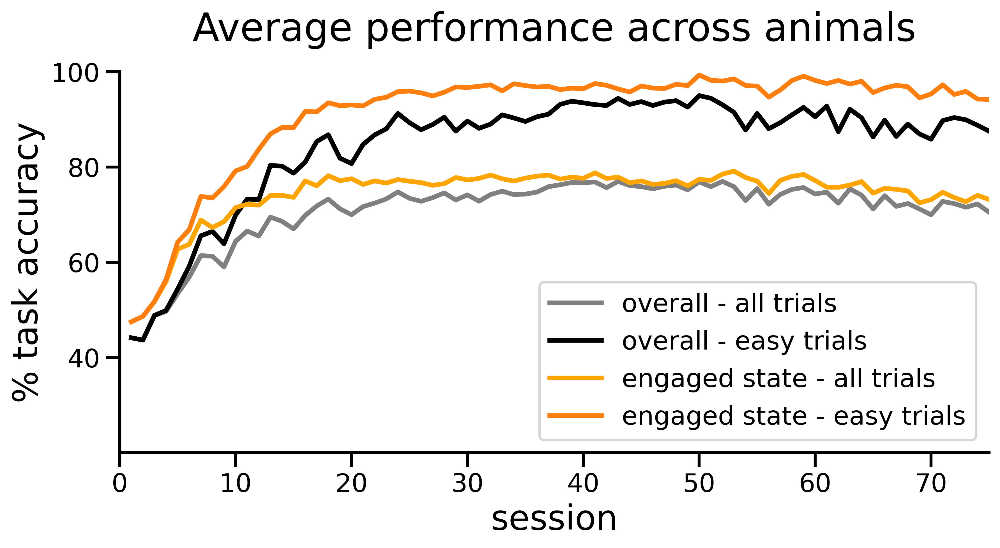

In [64]:
maxSess = 75

arrStateSeparateCorrect = np.ma.empty((maxSess,K,len(subjectsAll), 2))
arrStateSeparateCorrect.mask = True

arrOverallSeparateCorrect = np.ma.empty((maxSess,len(subjectsAll), 2))
arrOverallSeparateCorrect.mask = True

arrEmpiricalCorrect = np.ma.empty((maxSess,len(subjectsAll)))
arrEmpiricalCorrect.mask = True

arrEmpiricalCorrectSeparate = np.ma.empty((maxSess,len(subjectsAll), 2))
arrEmpiricalCorrectSeparate.mask = True

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    stop = min(len(sessInd)-1, maxSess)
    arrStateSeparateCorrect[:stop, :K, idx, 0] = allStateCorrectSeparate[idx, 0][:stop] # hard
    arrStateSeparateCorrect[:stop, :K, idx, 1] = allStateCorrectSeparate[idx, 1][:stop] # easy
    arrOverallSeparateCorrect[:stop, idx, 0] = allOverallCorrectSeparate[idx, 0][:stop]
    arrOverallSeparateCorrect[:stop, idx, 1] = allOverallCorrectSeparate[idx, 1][:stop]


    arrEmpiricalCorrect[:stop, idx] = allEmpiricalCorrect[idx][:stop] 
    arrEmpiricalCorrectSeparate[:stop, idx, 0] = allEmpiricalCorrectSeparate[idx, 0][:stop] 
    arrEmpiricalCorrectSeparate[:stop, idx, 1] = allEmpiricalCorrectSeparate[idx, 1][:stop] 
    

fig, axes = plt.subplots(1, figsize = (10,4.5), dpi=400) 
# performance in general
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrOverallCorrect, axis=1)-np.nanstd(arrOverallCorrect, axis=1), np.nanmean(arrOverallCorrect, axis=1)+np.nanstd(arrOverallCorrect, axis=1), alpha=0.2, zorder=0, color="gray")
axes.plot(range(1,maxSess+1), np.nanmean(arrOverallCorrect, axis=1), color="gray", linewidth=3, label='overall - all trials', zorder=1)
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrOverallSeparateCorrect[:,:,1], axis=1)-np.nanstd(arrOverallSeparateCorrect[:,:,1], axis=1), np.nanmean(arrOverallSeparateCorrect[:,:,1], axis=1)+np.nanstd(arrOverallSeparateCorrect[:,:,1], axis=1), alpha=0.2, zorder=0, color="black")
axes.plot(range(1,maxSess+1), np.nanmean(arrOverallSeparateCorrect[:,:,1], axis=1), color="black", linewidth=3, label='overall - easy trials', zorder=1)


# performance in state 1
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,0,:], axis=1)-np.nanstd(arrStateCorrect[:,0,:], axis=1), np.nanmean(arrStateCorrect[:,0,:], axis=1)+np.nanstd(arrStateCorrect[:,0,:], axis=1), alpha=0.2, zorder=0, color="orange")
axes.plot(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,0,:], axis=1), color="orange", linewidth=3, label='engaged state - all trials', zorder=1)
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrStateSeparateCorrect[:,0,:,1], axis=1)-np.nanstd(arrStateSeparateCorrect[:,0,:,1], axis=1), np.nanmean(arrStateSeparateCorrect[:,0,:,1], axis=1)+np.nanstd(arrStateSeparateCorrect[:,0,:,1], axis=1), alpha=0.2, zorder=0, color='tab:orange')
axes.plot(range(1,maxSess+1), np.nanmean(arrStateSeparateCorrect[:,0,:,1], axis=1), color="tab:orange", linewidth=3, label='engaged state - easy trials', zorder=1)

axes.set_ylabel('% task accuracy', size=22)
axes.set_xlabel('session', size=22)
axes.set_yticks([40,60,80,100])
axes.set_ylim(20,100)
axes.set_xlim(0,75)
axes.axhline(0.5, color="black", linestyle="--", lw=1, alpha=0.3, zorder=0)
axes.spines[['right', 'top']].set_visible(False)
axes.legend(loc='lower right')
axes.set_title('Average performance across animals' ,size=25, pad=20)
plt.savefig(f'../figures/Accuracy_TotalvsEngaged_allAnimals', bbox_inches='tight', dpi=400)

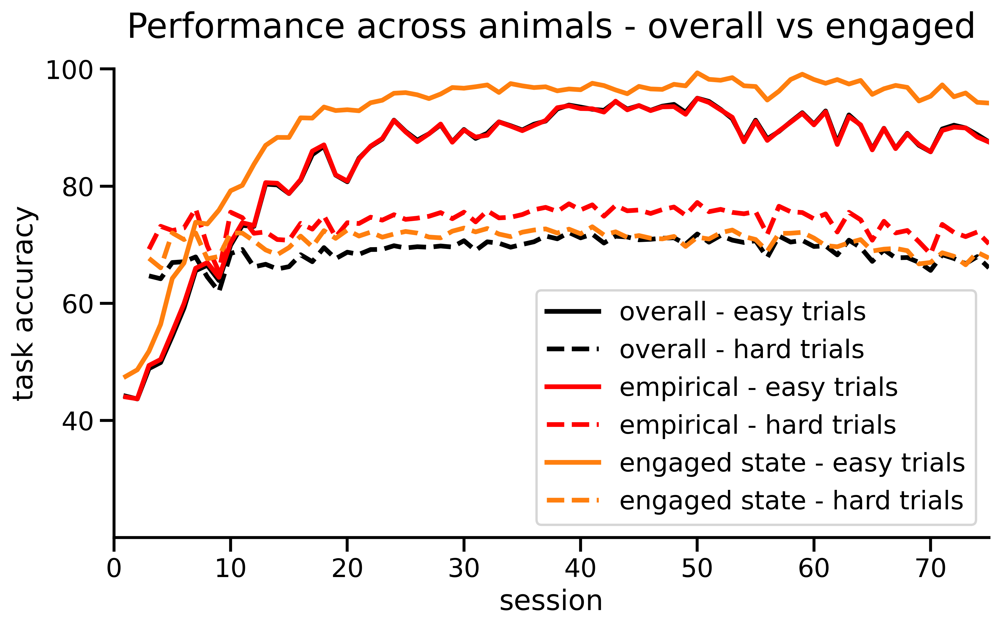

In [34]:
fig, axes = plt.subplots(1, figsize = (10,5.5), dpi=400) 
# performance in general
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrOverallSeparateCorrect[:,:,1], axis=1)-np.nanstd(arrOverallSeparateCorrect[:,:,1], axis=1), np.nanmean(arrOverallSeparateCorrect[:,:,1], axis=1)+np.nanstd(arrOverallSeparateCorrect[:,:,1], axis=1), alpha=0.2, zorder=0, color="black")
axes.plot(range(1,maxSess+1), np.nanmean(arrOverallSeparateCorrect[:,:,1], axis=1), color="black", linewidth=3, label='overall - easy trials', zorder=1)
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrOverallSeparateCorrect[:,:,0], axis=1)-np.nanstd(arrOverallSeparateCorrect[:,:,0], axis=1), np.nanmean(arrOverallSeparateCorrect[:,:,0], axis=1)+np.nanstd(arrOverallSeparateCorrect[:,:,0], axis=1), alpha=0.2, zorder=0, color="black")
axes.plot(range(1,maxSess+1), np.nanmean(arrOverallSeparateCorrect[:,:,0], axis=1), color="black", linewidth=3, linestyle='dashed', label='overall - hard trials', zorder=1)

# empirical 
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrEmpiricalCorrectSeparate[:,:,1], axis=1)-np.nanstd(arrEmpiricalCorrectSeparate[:,:,1], axis=1), np.nanmean(arrEmpiricalCorrectSeparate[:,:,1], axis=1)+np.nanstd(arrEmpiricalCorrectSeparate[:,:,1], axis=1), alpha=0.2, zorder=0, color="red")
axes.plot(range(1,maxSess+1), np.nanmean(arrEmpiricalCorrectSeparate[:,:,1], axis=1), color="red", linewidth=3, label='empirical - easy trials', zorder=1)
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrEmpiricalCorrectSeparate[:,:,0], axis=1)-np.nanstd(arrEmpiricalCorrectSeparate[:,:,0], axis=1), np.nanmean(arrEmpiricalCorrectSeparate[:,:,0], axis=1)+np.nanstd(arrEmpiricalCorrectSeparate[:,:,0], axis=1), alpha=0.2, zorder=0, color="red")
axes.plot(range(1,maxSess+1), np.nanmean(arrEmpiricalCorrectSeparate[:,:,0], axis=1), color="red", linewidth=3, linestyle='dashed', label='empirical - hard trials', zorder=1)



# # performance in state 1
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrStateSeparateCorrect[:,0,:,1], axis=1)-np.nanstd(arrStateSeparateCorrect[:,0,:,1], axis=1), np.nanmean(arrStateSeparateCorrect[:,0,:,1], axis=1)+np.nanstd(arrStateSeparateCorrect[:,0,:,1], axis=1), alpha=0.2, zorder=0, color='tab:orange')
axes.plot(range(1,maxSess+1), np.nanmean(arrStateSeparateCorrect[:,0,:,1], axis=1), color="tab:orange", linewidth=3, label='engaged state - easy trials', zorder=1)
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrStateSeparateCorrect[:,0,:,0], axis=1)-np.nanstd(arrStateSeparateCorrect[:,0,:,0], axis=1), np.nanmean(arrStateSeparateCorrect[:,0,:,0], axis=1)+np.nanstd(arrStateSeparateCorrect[:,0,:,0], axis=1), alpha=0.2, zorder=0, color='tab:orange')
axes.plot(range(1,maxSess+1), np.nanmean(arrStateSeparateCorrect[:,0,:,0], axis=1), color="tab:orange", linewidth=3, linestyle='dashed', label='engaged state - hard trials', zorder=1)

axes.set_ylabel('task accuracy')
axes.set_xlabel('session')
axes.set_yticks([40,60,80,100])
axes.set_ylim(20,100)
axes.set_xlim(0,75)
axes.axhline(0.5, color="black", linestyle="--", lw=1, alpha=0.3, zorder=0)
axes.spines[['right', 'top']].set_visible(False)
axes.legend(loc='lower right')
axes.set_title('Performance across animals - overall vs engaged' ,size=22, pad=20)
plt.savefig(f'../figures/Accuracy_HardvsEasy_allAnimals', bbox_inches='tight', dpi=400)

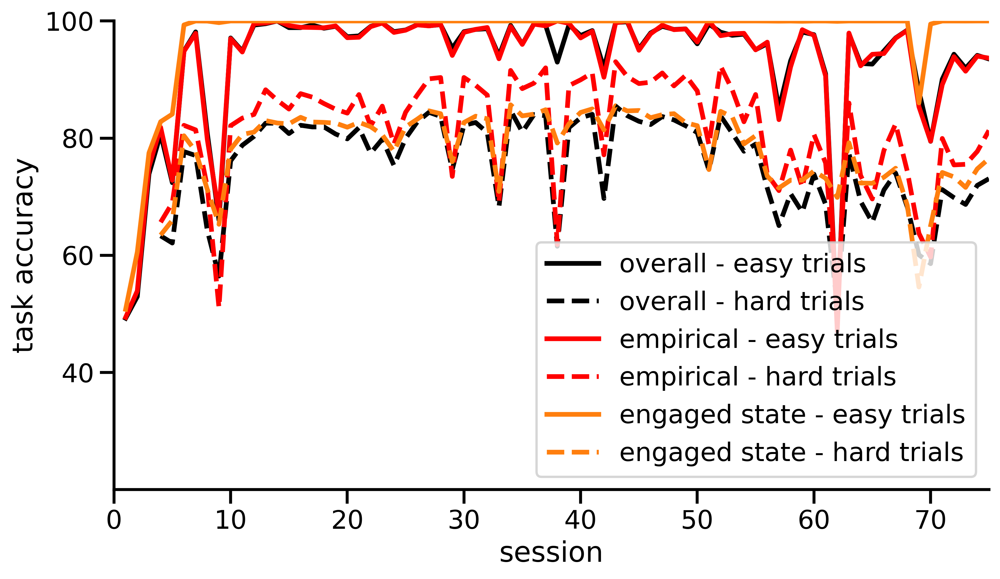

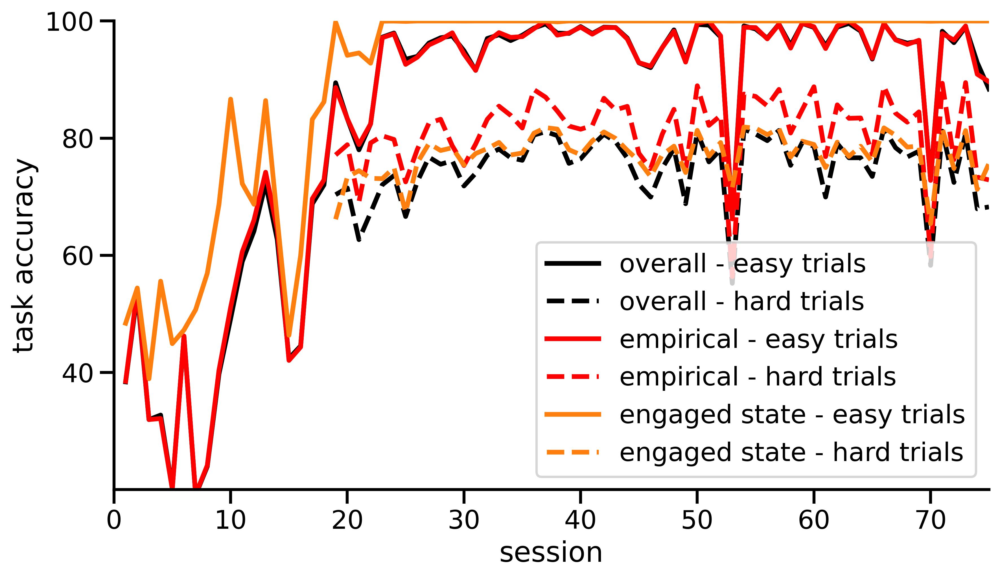

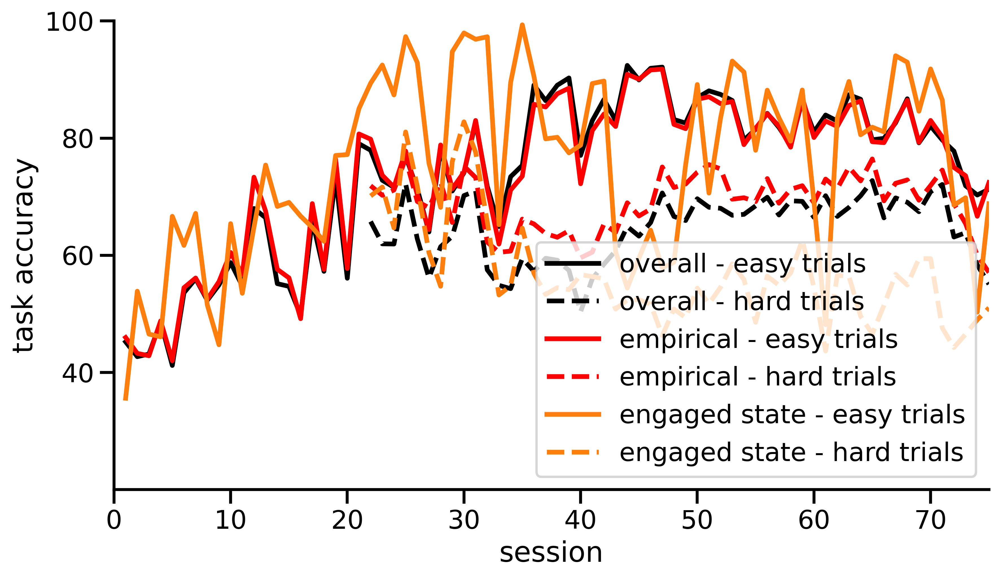

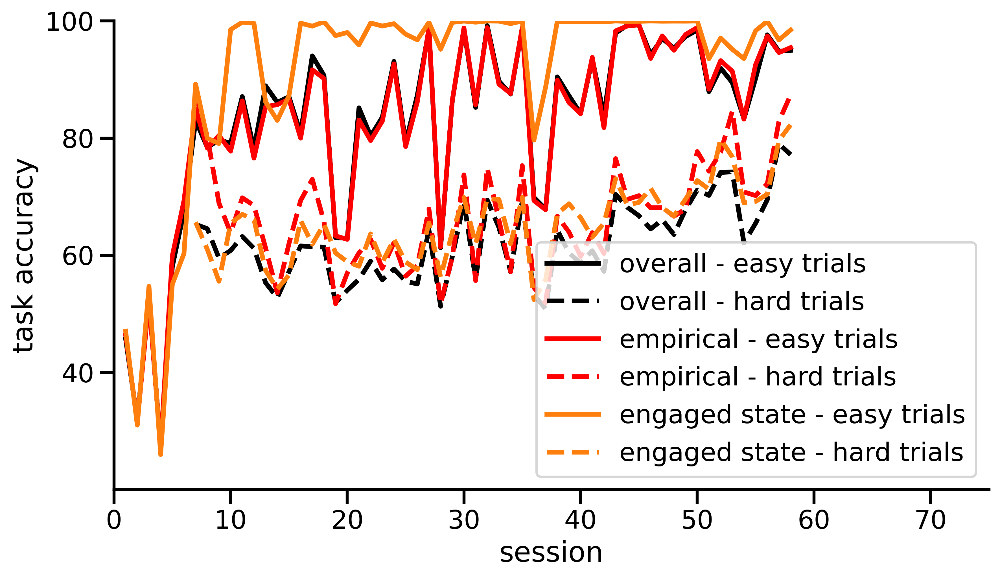

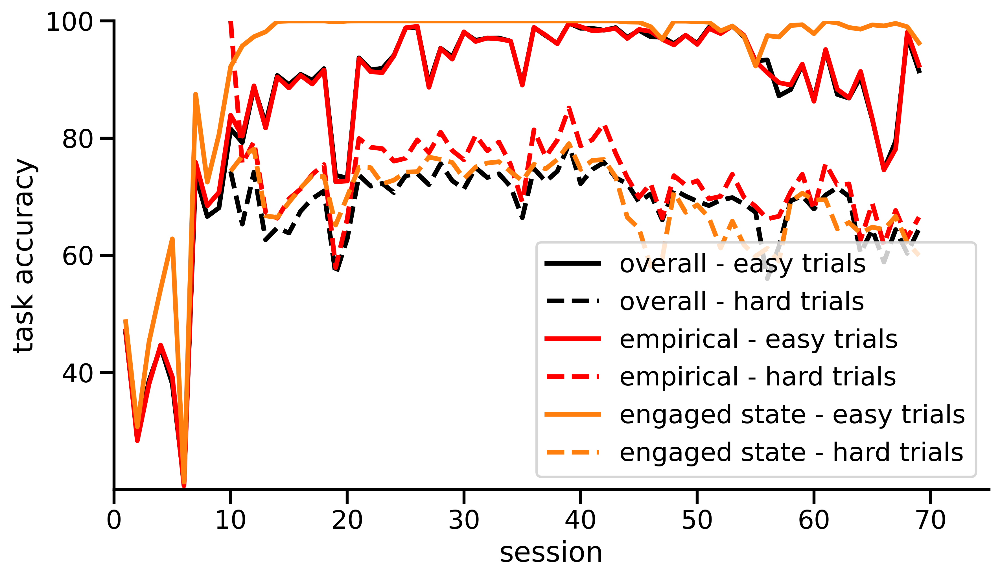

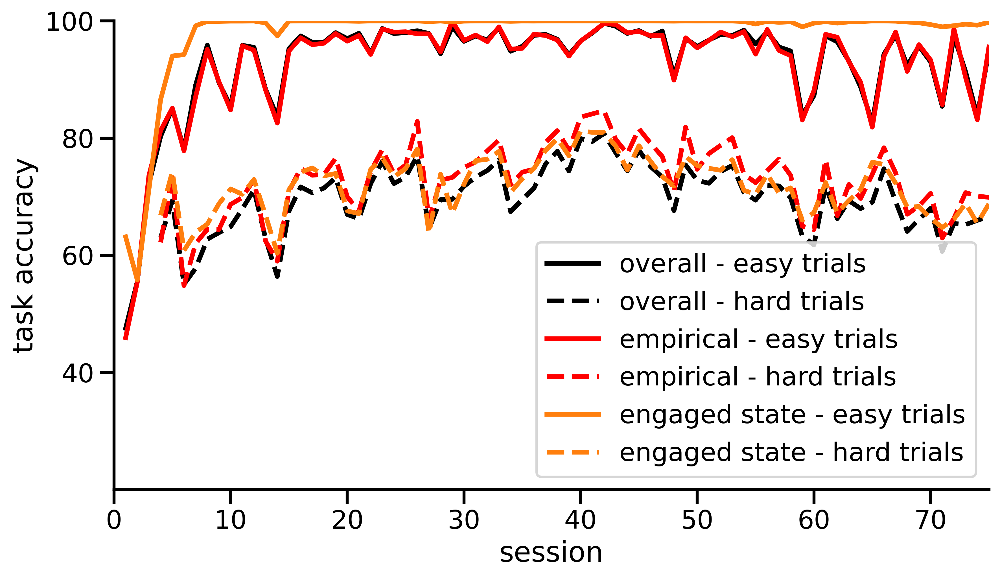

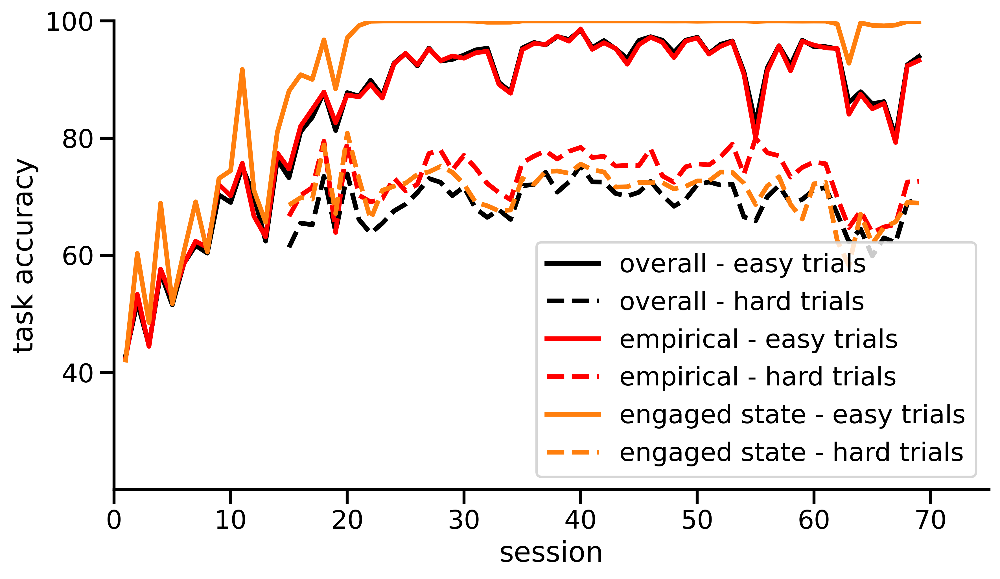

In [19]:
for idx in [0,5,10,15,20,25,30]:
    fig, axes = plt.subplots(1, figsize = (10,5.5), dpi=400) 
    # performance in general
    axes.plot(range(1,maxSess+1), arrOverallSeparateCorrect[:,idx,1], color="black", linewidth=3, label='overall - easy trials', zorder=1)
    axes.plot(range(1,maxSess+1), arrOverallSeparateCorrect[:,idx,0], color="black", linewidth=3, linestyle='dashed', label='overall - hard trials', zorder=1)

    # empirical 
    axes.plot(range(1,maxSess+1), arrEmpiricalCorrectSeparate[:,idx,1], color="red", linewidth=3, label='empirical - easy trials', zorder=1)
    axes.plot(range(1,maxSess+1), arrEmpiricalCorrectSeparate[:,idx,0], color="red", linewidth=3, linestyle='dashed', label='empirical - hard trials', zorder=1)

    # # performance in state 1
    axes.plot(range(1,maxSess+1), arrStateSeparateCorrect[:,0,idx,1], color="tab:orange", linewidth=3, label='engaged state - easy trials', zorder=1)
    axes.plot(range(1,maxSess+1), arrStateSeparateCorrect[:,0,idx,0], color="tab:orange", linewidth=3, linestyle='dashed', label='engaged state - hard trials', zorder=1)

    axes.set_ylabel('task accuracy')
    axes.set_xlabel('session')
    axes.set_yticks([40,60,80,100])
    axes.set_ylim(20,100)
    axes.set_xlim(0,75)
    axes.axhline(0.5, color="black", linestyle="--", lw=1, alpha=0.3, zorder=0)
    axes.spines[['right', 'top']].set_visible(False)
    axes.legend(loc='lower right')

In [ ]:
maxSess = 75

arrStateEasyCorrect = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateEasyCorrect.mask = True

arrOverallEasyCorrect = np.ma.empty((maxSess,len(subjectsAll)))
arrOverallEasyCorrect.mask = True

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    stop = min(len(sessInd)-1, maxSess)
    arrStateEasyCorrect[:stop, :K, idx] = allStateEasyCorrect[idx][:stop]
    arrOverallEasyCorrect[:stop, idx] = allOverallEasyCorrect[idx][:stop]
    

# for idx in range(0,len(subjectsAll)):
#     subject = subjectsAll[idx]
#     x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=-1, D=D)
#     biasedBlockTrials, biasedBlockStartInd, biasedBlockSession, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, -1)
#     allEasyPerf[idx], allPerf[idx] = IBL_performance(dfAll, subject, plot=False) # empirical accuracy

#     stop = min(len(sessInd)-1, maxSess)
#     arrPerf[:stop, idx] = allPerf[idx][:stop]
#     arrEasyPerf[:stop, idx] = allEasyPerf[idx][:stop]

#     # index 0 for engaged state (state 1)
#     arrEngagedPerf[:stop, idx] = allStateCorrect[idx][:stop,0] / 100 # rescaling from 0 to 1 instead of percentages
#     arrEngagedEasyPerf[:stop, idx] = allStateEasyCorrect[idx][:stop,0] / 100 

fig, axes = plt.subplots(1, figsize = (10,4.5), dpi=400) 
# performance in general
axes.fill_between(range(1,maxSess+1), np.nanmean(arrOverallCorrect, axis=1)-np.nanstd(arrOverallCorrect, axis=1), np.nanmean(arrOverallCorrect, axis=1)+np.nanstd(arrOverallCorrect, axis=1), alpha=0.2, zorder=0, color="gray")
axes.plot(range(1,maxSess+1), np.nanmean(arrOverallCorrect, axis=1), color="gray", linewidth=3, label='overall - all trials', zorder=1)
axes.fill_between(range(1,maxSess+1), np.nanmean(arrOverallEasyCorrect, axis=1)-np.nanstd(arrOverallEasyCorrect, axis=1), np.nanmean(arrOverallEasyCorrect, axis=1)+np.nanstd(arrOverallEasyCorrect, axis=1), alpha=0.2, zorder=0, color="black")
axes.plot(range(1,maxSess+1), np.nanmean(arrOverallEasyCorrect, axis=1), color="black", linewidth=3, label='overall - easy trials', zorder=1)


# performance in state 1
axes.fill_between(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,0,:], axis=1)-np.nanstd(arrStateCorrect[:,0,:], axis=1), np.nanmean(arrStateCorrect[:,0,:], axis=1)+np.nanstd(arrStateCorrect[:,0,:], axis=1), alpha=0.2, zorder=0, color="orange")
axes.plot(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,0,:], axis=1), color="orange", linewidth=3, label='engaged state - all trials', zorder=1)
axes.fill_between(range(1,maxSess+1), np.nanmean(arrStateEasyCorrect[:,0,:], axis=1)-np.nanstd(arrStateEasyCorrect[:,0,:], axis=1), np.nanmean(arrStateEasyCorrect[:,0,:], axis=1)+np.nanstd(arrStateEasyCorrect[:,0,:], axis=1), alpha=0.2, zorder=0, color='tab:orange')
axes.plot(range(1,maxSess+1), np.nanmean(arrStateEasyCorrect[:,0,:], axis=1), color="tab:orange", linewidth=3, label='engaged state - easy trials', zorder=1)

axes.set_ylabel('task accuracy')
axes.set_xlabel('session')
axes.set_yticks([40,60,80,100])
axes.set_ylim(20,100)
axes.set_xlim(0,75)
axes.axhline(0.5, color="black", linestyle="--", lw=1, alpha=0.3, zorder=0)
axes.spines[['right', 'top']].set_visible(False)
axes.legend(loc='lower right')
axes.set_title('Performance across animals - overall vs engaged' ,size=22, pad=20)
plt.savefig(f'../figures/Accuracy_TotalvsEngaged_allAnimals', bbox_inches='tight', dpi=400)

In [80]:
subjectsAll = []
labChosen =  ['angelakilab','churchlandlab','wittenlab']
dict_subjects = {'angelakilab':[],'churchlandlab':[],'wittenlab':[]}
for lab in labChosen:
    subjects = np.unique(dfAll[dfAll['lab'] == lab]['subject']).tolist()
    subjectsAll = subjectsAll + subjects

if ('NYU-01' in subjectsAll):
    subjectsAll.remove('NYU-01')
if ('NYU-06' in subjectsAll):
    subjectsAll.remove('NYU-06')
if ('CSHL_007' in subjectsAll):
    subjectsAll.remove('CSHL_007')
if ('CSHL049' in subjectsAll):
    subjectsAll.remove('CSHL049')
 
lab_identity = np.ones((len(subjectsAll))).astype(int) * -1

for subject_idx in range(len(subjectsAll)):
    subject = subjectsAll[subject_idx]
    for z in range(len(labChosen)):
        lab = labChosen[z]
        subjects = np.unique(dfAll[dfAll['lab'] == lab]['subject']).tolist()
        if subject in subjects:
            lab_identity[subject_idx] = z

print(subjectsAll)
print(lab_identity)

colors_labs = ['tab:yellow','tab:red','tab:purple']

['IBL-T1', 'IBL-T2', 'IBL-T3', 'IBL-T4', 'NYU-02', 'NYU-04', 'NYU-07', 'NYU-09', 'NYU-12', 'NYU-13', 'CSHL_001', 'CSHL_002', 'CSHL_003', 'CSHL_004', 'CSHL_005', 'CSHL_006', 'CSHL_008', 'CSHL_010', 'CSHL_012', 'CSHL_014', 'CSHL_015', 'ibl_witten_02', 'ibl_witten_03', 'ibl_witten_04', 'ibl_witten_05', 'ibl_witten_06', 'ibl_witten_07', 'ibl_witten_12', 'ibl_witten_13', 'ibl_witten_14', 'ibl_witten_15', 'ibl_witten_16']
[0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2]


ValueError: 'color' kwarg must be a color or sequence of color specs.  For a sequence of values to be color-mapped, use the 'c' argument instead.

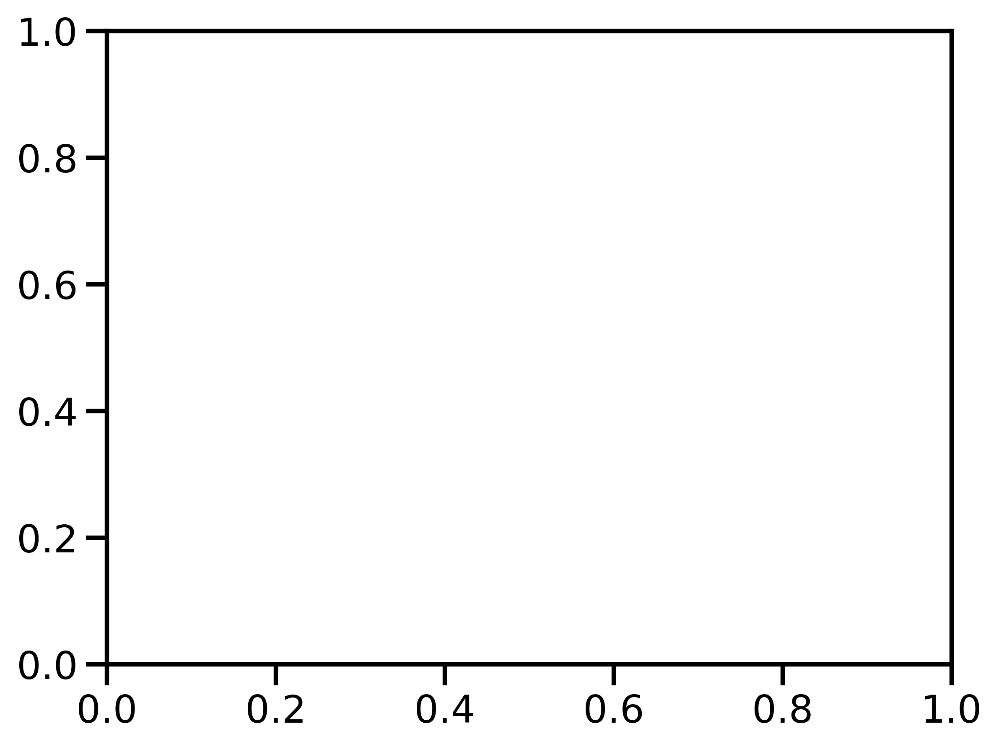

In [81]:
# Learning times IBL vs dGLM-HMM
treshold = 95
def learning_time(accuracySession, treshold=0.95): # decided for accuracy on easy trials  
    sessions = accuracySession.shape[0]
    time = -1
    for t in range(1,sessions):
        if (np.mean(accuracySession[t-1:t+1]) >= treshold):
            time = t
            break 
    return time

fig, axes = plt.subplots(1, figsize = (6.5, 5), dpi=400) 

learningTimes = np.zeros((len(subjectsAll)))
firstBlockSession = np.zeros((len(subjectsAll)))
for idx in range(0, len(subjectsAll)):
    learningTimes[idx] = learning_time(arrStateSeparateCorrect[:,0,idx, 1], treshold=treshold)

    subject = subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    _, _, _, firstBlockSession[idx] = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)

    axes.scatter(learningTimes[idx], firstBlockSession[idx], color=colors_labs[int(lab_identity[idx])], alpha=0.7, label=labChosen[int(lab_identity[idx])])

axes.set_ylabel('IBL end of training', size=22)
axes.set_xlabel('engaged state accuracy on easy trials > ' + str(treshold) +'%', size=22)
axes.set_xlim(0,65)
axes.set_ylim(0,65)
axes.spines[['right', 'top']].set_visible(False)
axes.set_title('Learning times across animals', size=25, pad=10)
axes.plot([0, 65], [0, 65], ls="--", c='black')
# axes.set_yticks(range(0,15,5), range(0,15,5))
# axes.legend(loc='upper right', prop={'size': 11})
plt.savefig(f'../figures/LearningTimes_Scatter_allAnimals', bbox_inches='tight', dpi=400)

In [54]:
def accuracy_mixture_states_sessions(gamma, phi, y, correctSide, sessInd):
    '''   
    function that probabilistically computes accuracy for each state and overall (no hard assigning)

    P(y_t = correct choice | x_t) = sum over k of p(y_t=correct choice |x_t, z_t=k) * p(z_t=k)

    '''
    K = gamma.shape[1]
    N = y.shape[0]
    p_correct_states = np.zeros((N, K))
    p_correct = np.zeros(N)
    p_correct_sessions = np.zeros((len(sessInd)-1))
    for session in range(0, len(sessInd)-1):
        p_states = np.mean(gamma[sessInd[session]:sessInd[session+1],:], axis=0)
        for t in range(sessInd[session],sessInd[session+1]):
            for k in range(0,K):
                p_correct_states[t, k] = phi[t, k, correctSide[t]]
            p_correct[t] = p_correct_states[t, :] @ p_states
        p_correct_sessions[session] = np.mean(p_correct[sessInd[session]:sessInd[session+1]], axis=0)
    
    return 100*p_correct_sessions


for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    biasedBlockTrials, biasedBlockStartInd, biasedBlockSession, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)

    p_correct_sessions = accuracy_mixture_states_sessions(allGamma[idx], allPhi[idx], y, correctSide, sessInd)

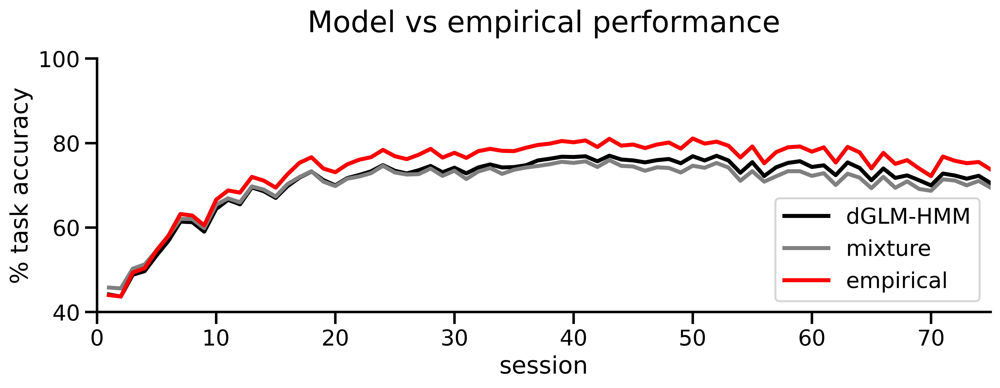

In [32]:
arrEmpiricalCorrect = np.ma.empty((maxSess,len(subjectsAll)))
arrEmpiricalCorrect.mask = True

arrEmpiricalCorrectSeparate = np.ma.empty((maxSess,len(subjectsAll), 2))
arrEmpiricalCorrectSeparate.mask = True

arrOverallMixtureCorrect = np.ma.empty((maxSess,len(subjectsAll)))
arrOverallMixtureCorrect.mask = True
maxSess = 75

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=-1, D=D)
    biasedBlockTrials, biasedBlockStartInd, biasedBlockSession, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, -1)
    # _, allEmpiricalCorrect = IBL_performance(dfAll, subject, plot=False) # empirical accuracy

    empiricalAccuracy = np.zeros((len(sessInd)-1))
    correct = correctSide == y
    for s in range(0,len(sessInd)-1):
        empiricalAccuracy[s] = np.mean(correct[sessInd[s]:sessInd[s+1]]) * 100

    empiricalAccuracySeparate = np.zeros((len(sessInd)-1), 2)
    

    allOverallMixtureCorrect[idx] = accuracy_mixture_states_sessions(allGamma[idx], allPhi[idx], y, correctSide, sessInd)

    stop = min(len(sessInd)-1, maxSess)
    arrEmpiricalCorrect[:stop, idx] = empiricalAccuracy[:stop] 
    arrOverallMixtureCorrect[:stop, idx] = allOverallMixtureCorrect[idx][:stop]

fig, axes = plt.subplots(1, figsize = (12,3.5), dpi=400) 
# dGLM-HMM overall accuracy
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrOverallCorrect, axis=1)-np.nanstd(arrOverallCorrect, axis=1), np.nanmean(arrOverallCorrect, axis=1)+np.nanstd(arrOverallCorrect, axis=1), alpha=0.2, zorder=0, color="black")
axes.plot(range(1,maxSess+1), np.nanmean(arrOverallCorrect, axis=1), color="black", linewidth=3, label='dGLM-HMM', zorder=1)

# Mixture overall accuracy
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrOverallMixtureCorrect, axis=1)-np.nanstd(arrOverallMixtureCorrect, axis=1), np.nanmean(arrOverallMixtureCorrect, axis=1)+np.nanstd(arrOverallMixtureCorrect, axis=1), alpha=0.2, zorder=0, color="gray")
axes.plot(range(1,maxSess+1), np.nanmean(arrOverallMixtureCorrect, axis=1), color="gray", linewidth=3, label='mixture', zorder=1)

# empirical accuracy
# axes.fill_between(range(1,maxSess+1), np.nanmean(arrEmpiricalCorrect, axis=1)-np.nanstd(arrEmpiricalCorrect, axis=1), np.nanmean(arrEmpiricalCorrect, axis=1)+np.nanstd(arrEmpiricalCorrect, axis=1), alpha=0.2, zorder=0, color="red")
axes.plot(range(1,maxSess+1), np.nanmean(arrEmpiricalCorrect, axis=1), color="red", linewidth=3, label='empirical', zorder=1)


axes.set_ylabel('% task accuracy')
axes.set_xlabel('session')
# axes.set_yticks([40,60,80])
axes.set_ylim(40,100)
axes.set_xlim(0,75)
axes.axhline(0.5, color="black", linestyle="--", lw=1, alpha=0.3, zorder=0)
axes.spines[['right', 'top']].set_visible(False)
axes.legend(loc='lower right')
axes.set_title('Model vs empirical performance' ,size=22, pad=20)
plt.savefig(f'../figures/Accuracy_Model-Empirical-Mixture_allAnimals', bbox_inches='tight', dpi=400)

   

(0.0, 18.0)

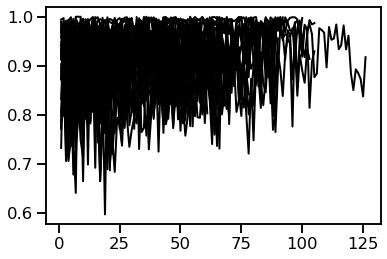

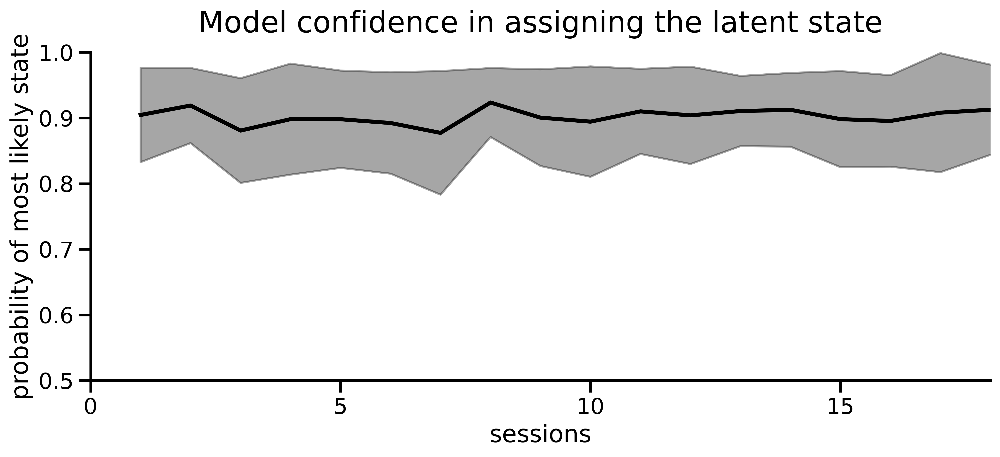

In [55]:
# Probability of most likely state - average across animals
maxSess = 75
bestSigmaInd = 7
K = 3

arrProbStateMax = np.ma.empty((maxSess,len(subjectsAll)))
arrProbStateMax.mask = True

fig, axes = plt.subplots(1) 
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    probMaxSession = distribution_most_likely_state(allGamma[idx], sessInd, axes)
    
    stop = min(len(sessInd)-1, maxSess)
    arrProbStateMax[:stop, idx] = probMaxSession[:stop]

fig, axes = plt.subplots(1, figsize = (12,4.5), sharex=True, dpi=400) 
axes.plot(range(1,maxSess+1), np.nanmean(arrProbStateMax, axis=1), color='black', linewidth=3)
axes.fill_between(range(1,maxSess+1), np.nanmean(arrProbStateMax, axis=1)-np.nanstd(arrProbStateMax, axis=1), np.nanmean(arrProbStateMax, axis=1)+np.nanstd(arrProbStateMax, axis=1), alpha=0.35, color='black')
axes.set_ylabel('probability of most likely state')
axes.set_title('Model confidence in assigning the latent state', size=22, pad=15)
axes.set_xlabel('sessions')
axes.set_ylim(0.5,1)
axes.spines[['right', 'top']].set_visible(False)
axes.set_xticks(range(0,18,5),range(0,18,5))
plt.savefig(f'../figures/Probability_most_likely_state_allAnimals', bbox_inches='tight', dpi=400)
axes.set_xlim(0,18)


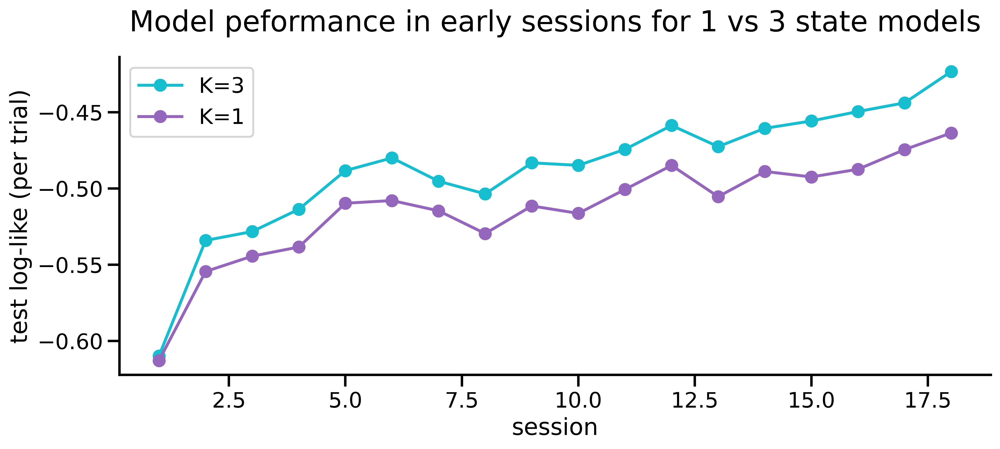

In [36]:
# setting hyperparameters
alphaList = [2*(10**x) for x in list(np.arange(-1,6,0.5,dtype=float))] 
L2penaltyW = 1
maxiter = 200
bestSigma = 1 # verified from fitting multiple sigmas
priorDirP = [100,10] # to read dGLMHMM1 model
fit_init_states = False
K = 3
D = 4 # number of features
sessStop = -1 # last session to use in fitting
splitFolds = 5

bestSigmaInd = 7 # equivalent to sigma=1
bestAlphaInd = 2 # equivalent to alpha=2

allW = np.empty((len(subjectsAll), 4), dtype=object)
allP = np.empty((len(subjectsAll), 4), dtype=object)
sessInterest = 18

testLl = np.zeros((len(subjectsAll), 2, sessInterest, splitFolds))

for idx in range(0, len(subjectsAll)):
    subject=subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D) # NOT LOOKING AT FULL DATASET
    N = x.shape[0]
    presentTrain, presentTest = split_data(N, sessInd, folds=splitFolds, blocks=10, random_state=1)
    
    data1 = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_1-state_multiple-sigmas_priorDirP={priorDirP}_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
    
    for fold in range(0, splitFolds):
        data3 = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_3-state_fold-{fold}_multiple-alphas_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
        
        W_3state = data3['W'][bestAlphaInd]
        P_3state = data3['P'][bestAlphaInd]
        pi3 = np.ones((3))/3
        W_1state = data1['allW'][fold, bestSigmaInd]
        P_1state = np.ones((N,1,1))
        pi1 = np.ones((1))

        dGLM_HMM_3state = dglm_hmm2.dGLM_HMM2(N,3,D,2)
        testLlSessions = dGLM_HMM_3state.evaluate_per_session(x, y, sessInd, presentTest[fold], P_3state, pi3, W_3state)
        testLl[idx,1,:,fold] = testLlSessions[0:sessInterest]

        dGLM_HMM_1state = dglm_hmm2.dGLM_HMM2(N,1,D,2)
        testLlSessions = dGLM_HMM_1state.evaluate_per_session(x, y, sessInd, presentTest[fold], P_1state, pi1, W_1state)
        testLl[idx,0,:,fold] = testLlSessions[0:sessInterest]


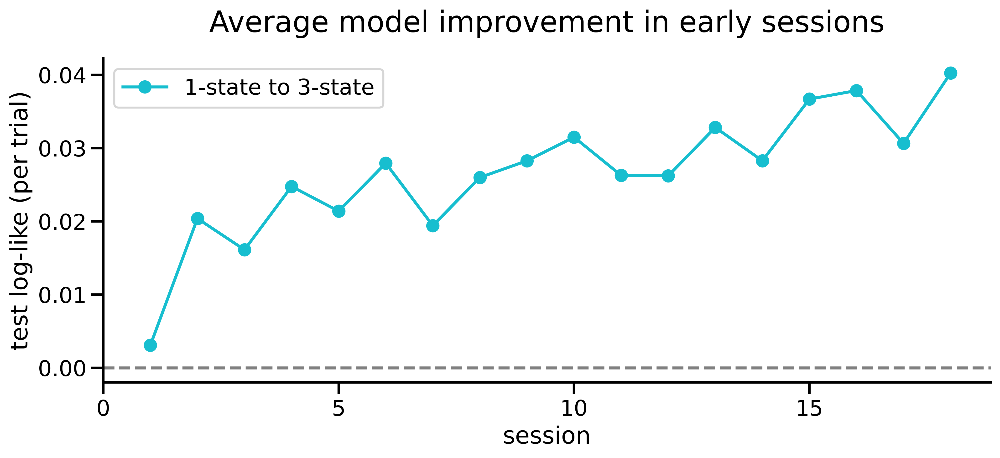

In [61]:
fig, axes = plt.subplots(1, figsize = (12,4.5), dpi=400)
avgTestLl = np.mean(testLl, axis=3)
avgTestLl = np.mean(avgTestLl, axis=0)
axes.plot(range(1,sessInterest+1), avgTestLl[1]-avgTestLl[0], '-o', color = colormap[2], label='1-state to 3-state')
axes.set_xlabel('session')
axes.set_ylabel('test log-like (per trial)')
axes.legend()
axes.set_title('Average model improvement in early sessions', size=25, pad=20)
axes.spines[['right', 'top']].set_visible(False)
axes.set_xticks(range(0,18,5),range(0,18,5))
axes.axhline(0, linestyle='dashed', color='gray')
plt.savefig(f'../figures/Test_Log-Like_1vs3states_early_sessions', bbox_inches='tight', dpi=400)

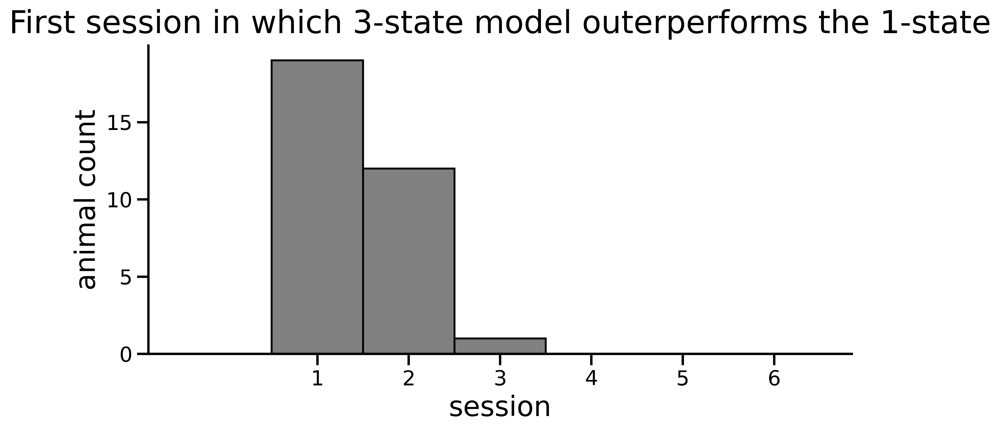

In [62]:
from scipy import stats
test_ll_animal = np.mean(testLl, axis=3)
first_session_better_3 = np.zeros((len(subjectsAll)))
for idx in range(len(subjectsAll)):
    for s in range(sessInterest):
        if test_ll_animal[idx, 1, s] > test_ll_animal[idx, 0, s]:
            first_session_better_3[idx] = s+1
            break

fig, axes = plt.subplots(1, figsize = (10,4.5), dpi=400)
axes.hist(first_session_better_3, bins=list(np.arange(-0.5,7.5,1)), color='gray', edgecolor='black')
axes.set_xlabel('session', size=22)
axes.set_ylabel('animal count', size=22)
axes.set_title('First session in which 3-state model outerperforms the 1-state', size=25, pad=10)
axes.set_xticks([1,2,3,4,5,6], [1,2,3,4,5,6])
axes.spines[['right', 'top']].set_visible(False)


In [50]:
print(first_session_better_3)

[2. 1. 1. 2. 1. 1. 1. 2. 2. 2. 1. 1. 2. 1. 1. 3. 2. 2. 1. 2. 2. 1. 2. 1.
 1. 1. 1. 2. 1. 1. 1. 1.]


In [ ]:
# Learning rates for hard vs easy trials (Correct vs Empirical)